In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import seaborn as sns
# import os
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
data = pd.read_csv("https://raw.githubusercontent.com/jsebastianzm/HR_T1_Analitica/main/data/data_preprocesamiento.csv")

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      4410 non-null   int64  
 1   BusinessTravel           4410 non-null   object 
 2   Department               4410 non-null   object 
 3   DistanceFromHome         4410 non-null   float64
 4   Education                4410 non-null   int64  
 5   EducationField           4410 non-null   object 
 6   EmployeeID               4410 non-null   int64  
 7   Gender                   4410 non-null   object 
 8   JobLevel                 4410 non-null   int64  
 9   JobRole                  4410 non-null   object 
 10  MaritalStatus            4410 non-null   object 
 11  MonthlyIncome            4410 non-null   float64
 12  NumCompaniesWorked       4410 non-null   int64  
 13  PercentSalaryHike        4410 non-null   int64  
 14  StockOptionLevel        

In [37]:
#Es necesario volver a asignar las variables como variables object ya que al crearse el dataframe y volver
# a leerse con la libreria pandas, las variables vuelven a cambiar de tipo.
columns_category = ['BusinessTravel', 'Department', 'Education', 'EducationField', 'EmployeeID', 'Gender', 
'JobLevel', 'JobRole', 'MaritalStatus', 'StockOptionLevel', 'EnvironmentSatisfaction', 'JobSatisfaction', 
'WorkLifeBalance', 'JobInvolvement', 'PerformanceRating', 'Attrition']
data[columns_category] = data[columns_category].astype(object)
data.drop(['EmployeeID'], axis = 1, inplace = True)

In [38]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      4410 non-null   int64  
 1   BusinessTravel           4410 non-null   object 
 2   Department               4410 non-null   object 
 3   DistanceFromHome         4410 non-null   float64
 4   Education                4410 non-null   object 
 5   EducationField           4410 non-null   object 
 6   Gender                   4410 non-null   object 
 7   JobLevel                 4410 non-null   object 
 8   JobRole                  4410 non-null   object 
 9   MaritalStatus            4410 non-null   object 
 10  MonthlyIncome            4410 non-null   float64
 11  NumCompaniesWorked       4410 non-null   int64  
 12  PercentSalaryHike        4410 non-null   int64  
 13  StockOptionLevel         4410 non-null   object 
 14  TotalWorkingYears       

In [39]:
ProfileReport(data, title="Análisis Exploratorio de Datos")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

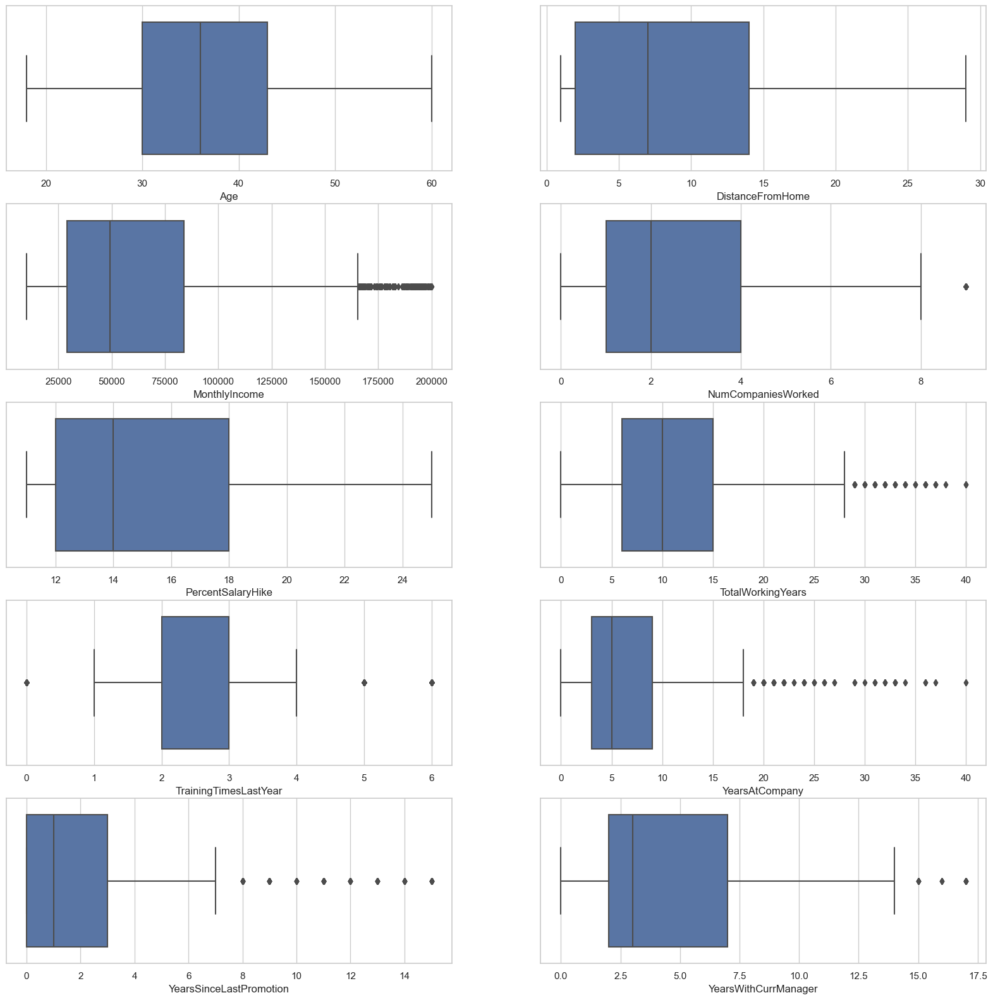

In [40]:
# --- Analisis de outliers ---
columns_boxplot = []
for i in data.columns:
    if data[i].dtype == 'int64' or data[i].dtype == 'float64':
        columns_boxplot.append(i)
# print(columns_boxplot)
plt.figure(figsize=(20,40))
for i, col in enumerate(columns_boxplot, start=1):
    ax = plt.subplot(10, 2, i)
    sns.boxplot(x = data[col], ax=ax)
    plt.xlabel(col)
plt.show()

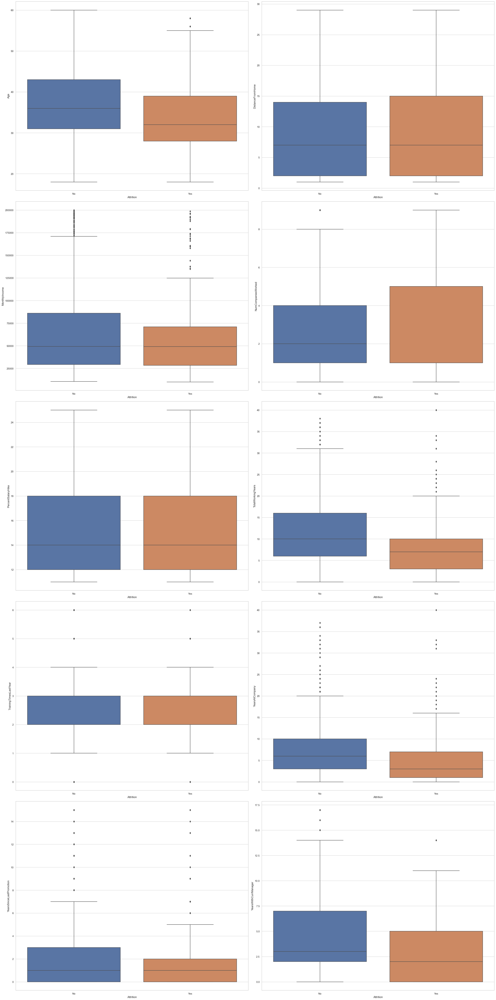

In [41]:
# Se crea un ciclo para poder observar como se comportan las variables numericas con la var objetivo Attrition
plt.figure(figsize=(30, 120))

for i, col in enumerate(columns_boxplot, start=1):
    ax = plt.subplot(10, 2, i)
    sns.boxplot(x='Attrition', y=col, data=data, ax=ax)
    plt.xlabel('Attrition')
    plt.ylabel(col)

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Correlación entre variables')

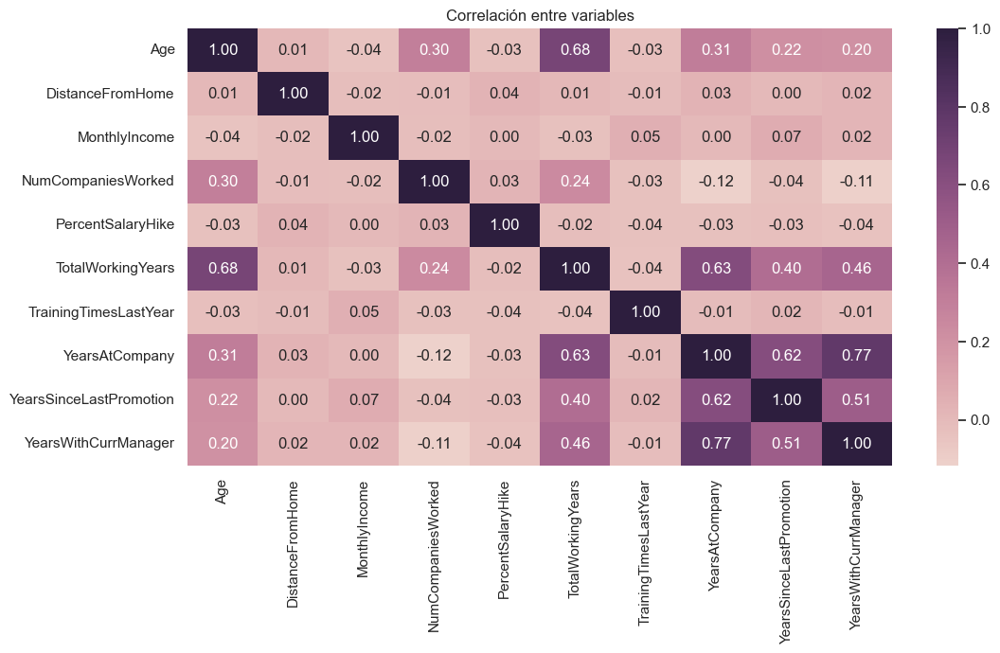

In [42]:

#Análisis de correlación con variables numericas
plt.figure(figsize = (12, 6))
sns.heatmap(data[columns_boxplot].corr(), annot = True, cmap = sns.cubehelix_palette(as_cmap=True), fmt = ".2f")
plt.title("Correlación entre variables")

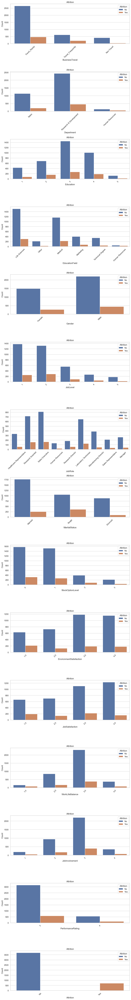

In [43]:
#Se compara la variable attrition con las variables categoricas
columns_countplot= []
for i in data.columns:
    if data[i].dtype != 'int64' and data[i].dtype != 'float64':
        columns_countplot.append(i)
# print(columns_countplot)

sns.set(style="whitegrid")  # Establecer estilo del gráfico

plt.figure(figsize=(10, 100))  # Tamaño de la figura

for i, col in enumerate(columns_countplot, start=1):

    ax = plt.subplot(20, 1, i)
    sns.countplot(x=col, hue='Attrition', data=data)
    # sns.countplot(x='DistanceFromHome', hue='Attrition', data=data)

    plt.xlabel(col)  # Etiqueta del eje x
    plt.ylabel('Count')  # Etiqueta del eje y
    plt.title('Attrition')  # Título del gráfico
    plt.legend(title='Attrition')  # Leyenda para 'Attrition'

    plt.xticks(rotation=45)  # Rotación de las etiquetas en el eje x para mayor legibilidad

plt.tight_layout()  # Ajustar el diseño del gráfico
plt.show()  # Mostrar el gráfico

In [45]:
#Se asignan las variables object a variables categoricas
dummies_variables = ["BusinessTravel", "Department", "Education", "EducationField", "Gender", "JobLevel", 
                     "Gender", "JobLevel", "JobRole", "MaritalStatus", "StockOptionLevel", "EnvironmentSatisfaction", 
                     "JobSatisfaction", "WorkLifeBalance", "JobInvolvement", "PerformanceRating"]
data_dummies = pd.get_dummies(data, columns=dummies_variables)

In [46]:
data_dummies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 76 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                4410 non-null   int64  
 1   DistanceFromHome                   4410 non-null   float64
 2   MonthlyIncome                      4410 non-null   float64
 3   NumCompaniesWorked                 4410 non-null   int64  
 4   PercentSalaryHike                  4410 non-null   int64  
 5   TotalWorkingYears                  4410 non-null   int64  
 6   TrainingTimesLastYear              4410 non-null   int64  
 7   YearsAtCompany                     4410 non-null   int64  
 8   YearsSinceLastPromotion            4410 non-null   int64  
 9   YearsWithCurrManager               4410 non-null   int64  
 10  Attrition                          4410 non-null   object 
 11  BusinessTravel_Non-Travel          4410 non-null   uint8

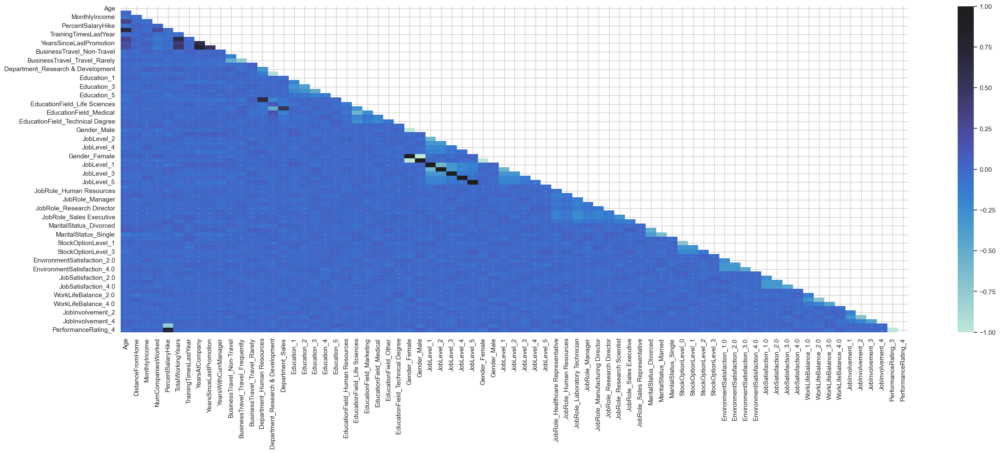

In [47]:
# --- Correlation Map (Heatmap) ---
mask = np.triu(np.ones_like(data_dummies.corr(), dtype=bool))
fig, ax = plt.subplots(figsize=(30, 10))
sns.heatmap(data_dummies.corr(), center = 1, mask = mask, cbar = True, annot = True, ax = ax, annot_kws={"size":1})
plt.show()

In [48]:
#Análisis de correlación con variables dummys
plt.figure(figsize = (100, 100))
sns.heatmap(data_dummies.corr(), annot = True, cmap = sns.cubehelix_palette(as_cmap=True), fmt = ".2f")
plt.title("Correlación entre variables")

Text(0.5, 1.0, 'Correlación entre variables')